# Parsing, chunking and embedding text data for RAG
The following highlights the process undertaken to prepare the pdf data for RAG operations.
I have made this as simple as possible, without much optimization.


# 1. Parsing
We may use pymupdf to parse the pdf's pages.

Notes:
- The top of the page is always the chapter. We use this and assign as "page_metadata".
- We will ignore early and late pages which are acknowledgements and references
- We store all pages in a pandas dataframe. This dataframe will contain chunks, embeddings, 
metadata etc.

Using this parsing technique, most pages contain noise:
- name of the book atop the page -> This line is always removed, the page is kept
- name of the chapter atop the page -> This line is always removed, the page is kept
- lines with "TABLE" or "FIGURE" often contain full pages of unparsable data
  -> If a string similar to these (using Levensthein distance) is found: we drop this page.

In [1]:
from core.readers.pdf_readers import _parse_pages
PDF_PATH = r"data/book.pdf"
pages = _parse_pages(PDF_PATH)
pages.head(50)

,doc_id,page,page_metadata,page_number
0,0,About the Website\nand make other changes to c...,INTRODUCTION,26
1,0,1\nFINANCIAL PLANNING &\nANALYSIS AND BUSINESS...,financial planning & analysis and business per...,27
2,0,managers attempting to use them for performanc...,financial planning & analysis and business per...,28
3,0,"dashboards, data visualization, analytics, and...",financial planning & analysis and business per...,29
4,0,PREVIEW OF THE BOOK\nThe book has been written...,financial planning & analysis and business per...,32
5,0,Part Two: Business Performance Management\nIn ...,financial planning & analysis and business per...,33
6,0,Part Four: Planning and Analysis for Critical ...,financial planning & analysis and business per...,34
7,0,SUMMARY\nMost senior ﬁnancial and operating ex...,financial planning & analysis and business per...,35
8,0,Part One\nFundamentals and Key\nFP&A Capabilit...,financial planning & analysis and business per...,36
9,0,2\nFUNDAMENTALS OF\nFINANCE\nCHAPTER INTRODUCT...,fundamentals of finance,37


# 2. Chunking
- Chunking is done manually by finding triple, double and single newline characters.
- Priority is given to triple, double and single line, in this order
- The maximum chunk length is set to 700 characters, possibly cutting a sentense in the middle...
- Using this technique, most chunks are about 600 to 700 characters longs.
- For simplicity we keep all chunks, but chunks with less than 100 characters should probably be 
dropped...
- Each chunks is assigned its page metadata


,doc_id,page_metadata,page_number,chunk,chunk_length
0,0,INTRODUCTION,26,About the Website\nand make other changes to c...,634
1,0,financial planning & analysis and business per...,27,1\nFINANCIAL PLANNING &\nANALYSIS AND BUSINESS...,698
2,0,financial planning & analysis and business per...,27,1\nFinancial Planning & Analysis and Performan...,155
3,0,financial planning & analysis and business per...,28,managers attempting to use them for performanc...,653
4,0,financial planning & analysis and business per...,28,"margins, days sales outstanding (DSO), and so ...",663
5,0,financial planning & analysis and business per...,28,leading indicators such as revenue patterns an...,653
6,0,financial planning & analysis and business per...,28,confusing to the rest of the organization. Key...,377
7,0,financial planning & analysis and business per...,29,"dashboards, data visualization, analytics, and...",685
8,0,financial planning & analysis and business per...,29,airplane allows the pilot to spot and identify...,618
9,0,financial planning & analysis and business per...,29,the instrument panel assists the pilots of an ...,658


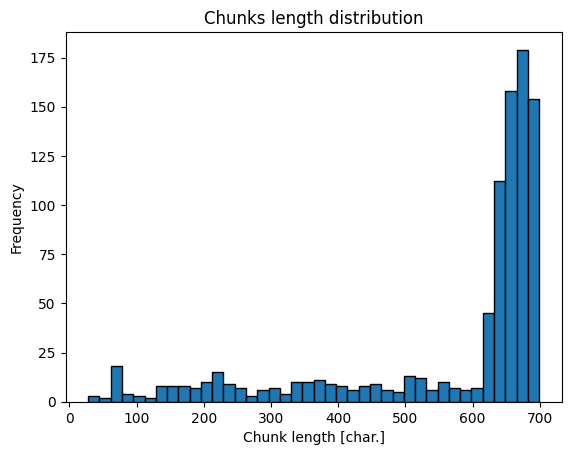

In [2]:
from core.readers.pdf_readers import _chunk_pages
import matplotlib.pyplot as plt

chunks = _chunk_pages(pages)
display(chunks.head(50))
chunks["chunk_length"].plot(kind="hist", bins=40, edgecolor="black")
plt.xlabel("Chunk length [char.]")
plt.ylabel("Frequency")
plt.title("Chunks length distribution")
plt.show()

# 3. Embedding
Embeddings is done using Ada3 or Ada2 which have the same API.
We do not use local embedders.

To possibly improve retrieval, we embed the following:
- Chunks
- Metadata
- Metadata (prefixed with a linebreak) + Chunks

In [3]:
from core.readers.pdf_readers import load_df
# from core.readers.pdf_readers import _embed_chunks
from core.settings.settings import Settings
from core.llmbackend.embedder_backend import AdaBackend

embedder = AdaBackend(settings=Settings())
# Requesting the embeddings is long, so this operation is commented out by default.
# vectors = _embed_chunks(chunks, embedder)
vectors = load_df("data/book_ada.parquet")
vectors

,doc_id,page_metadata,page_number,chunk_id,chunk,chunk_length,chunk_embedding,page_metadata_embedding,chunk_with_metadata_embedding
0,0,INTRODUCTION,26,0,About the Website\nand make other changes to c...,634,"[-0.007313489448279142, 0.008458387106657028, ...","[0.028674684464931488, -0.010570235550403595, ...","[0.0013161872047930956, 0.0027605348732322454,..."
1,0,financial planning & analysis and business per...,27,1,1\nFINANCIAL PLANNING &\nANALYSIS AND BUSINESS...,698,"[-0.0012318212538957596, -0.002259948523715138...","[-0.0033978959545493126, 0.015462270006537437,...","[-0.0046889157965779305, -0.00762442871928215,..."
2,0,financial planning & analysis and business per...,27,2,1\nFinancial Planning & Analysis and Performan...,155,"[-0.006769835017621517, -0.0077841030433773994...","[-0.0033978959545493126, 0.015462270006537437,...","[-0.01668434776365757, 0.007246094755828381, -..."
3,0,financial planning & analysis and business per...,28,3,managers attempting to use them for performanc...,653,"[-0.018527673557400703, 0.026829129084944725, ...","[-0.0033978959545493126, 0.015462270006537437,...","[-0.029060503467917442, 0.028215376660227776, ..."
4,0,financial planning & analysis and business per...,28,4,"margins, days sales outstanding (DSO), and so ...",663,"[0.01908794790506363, 0.003298864234238863, -0...","[-0.0033978959545493126, 0.015462270006537437,...","[0.0034806604962795973, 0.0033801160752773285,..."
...,...,...,...,...,...,...,...,...,...
910,0,summary and where to from here?,590,910,using one or more commonly accepted techniques...,367,"[-0.00579080730676651, 0.021113933995366096, -...","[-0.02410065196454525, -0.0008962770807556808,...","[-0.010712613351643085, 0.02323715202510357, -..."
911,0,summary and where to from here?,591,911,Glossary\nVariable Cost\nA cost that varies wi...,639,"[-0.00935289729386568, 0.04988211765885353, -0...","[-0.02410065196454525, -0.0008962770807556808,...","[-0.02390623837709427, 0.04812254384160042, -0..."
912,0,summary and where to from here?,592,912,ACKNOWLEDGMENTS\nI have been blessed in many w...,650,"[0.02896929532289505, 0.0004432418500073254, -...","[-0.02410065196454525, -0.0008962770807556808,...","[0.004575234837830067, 0.005174559075385332, -..."
913,0,summary and where to from here?,592,913,"the scope, depth, and use of performance measu...",634,"[0.018688632175326347, 0.020036228001117706, -...","[-0.02410065196454525, -0.0008962770807556808,...","[-0.00014070284669287503, 0.020656200125813484..."


# 4. Tuning parameters using lower dimensional visualization & clustering
Let's produce multiple embeddings, using differents configurations
** This is very slow and paid for, so this is commented out by default **

In [4]:
# from core.readers.pdf_readers import pdf_ingestion_pipeline
# 
# # We'll use two different embedders
# ada2 = AdaBackend(model="text-embedding-ada-002", settings=Settings())
# ada3 = AdaBackend(model="text-embedding-3-large", settings=Settings())
# 
# # Let's now use different chunks sizes and embedders
# save_path = "data/ada2_700len"
# pdf_ingestion_pipeline(file_path = PDF_PATH,
#                        save_path=save_path,
#                        embedder=ada2,
#                        max_len=700)
# save_path = "data/ada2_1200len"
# pdf_ingestion_pipeline(file_path = PDF_PATH,
#                        save_path=save_path,
#                        embedder=ada2,
#                        max_len=1200)
# save_path = "data/ada3_700len"
# pdf_ingestion_pipeline(file_path = PDF_PATH,
#                        save_path=save_path,
#                        embedder=ada3,
#                        max_len=700)
# save_path = "data/ada3_1200len"
# pdf_ingestion_pipeline(file_path = PDF_PATH,
#                        save_path=save_path,
#                        embedder=ada3,
#                        max_len=1200)

We may use a lower dimensionnal representation of the embeddings to draw some conclusions.
Bunka uses UMAP dimension reductions. We can then perform clusterings using a Kmeans algorithm.
Let's perform this operation on the embeddings of chunks, and chunks + metadata, for all chunks 
sizes and embedders.

In [5]:
# Let's now generate the dataviz for all files and combinaisons of parameters.
# This pipelines reduces the chunks embeddings to dimension=2 using umap
# It then computes clusters and assigns them a "class" using tf-idf
from core.utils.notebook_supporting_functions import bunka_pipeline
file_paths = ["data/ada2_700len",
              "data/ada2_1200len",
              "data/ada3_700len",
              "data/ada3_1200len"]

for file in file_paths:
    bunka_pipeline(file)

2024-06-28 20:52:02 - Bunka - INFO - Processing 111870 tokens
2024-06-28 20:52:03 - Bunka - INFO - Detected language: English
2024-06-28 20:52:03 - Bunka - INFO - Embedding documents... (can take varying amounts of time depending on their size)
2024-06-28 20:52:03 - Bunka - INFO - Reducing the dimensions of embeddings...
2024-06-28 20:52:36 - Bunka - INFO - Extracting meaningful terms from documents...


✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


100%|██████████| 915/915 [00:18<00:00, 50.38it/s]
2024-06-28 20:53:06 - Bunka - INFO - Computing the topics
2024-06-28 20:53:07 - Bunka - INFO - Creating the Bunka Map


2024-06-28 20:53:09 - Bunka - INFO - Processing 111870 tokens
2024-06-28 20:53:09 - Bunka - INFO - Detected language: English
2024-06-28 20:53:09 - Bunka - INFO - Embedding documents... (can take varying amounts of time depending on their size)
2024-06-28 20:53:09 - Bunka - INFO - Reducing the dimensions of embeddings...
2024-06-28 20:53:12 - Bunka - INFO - Extracting meaningful terms from documents...
100%|██████████| 915/915 [00:16<00:00, 53.84it/s]
2024-06-28 20:53:30 - Bunka - INFO - Computing the topics
2024-06-28 20:53:30 - Bunka - INFO - Creating the Bunka Map


2024-06-28 20:53:32 - Bunka - INFO - Processing 112115 tokens
2024-06-28 20:53:32 - Bunka - INFO - Detected language: English
2024-06-28 20:53:32 - Bunka - INFO - Embedding documents... (can take varying amounts of time depending on their size)
2024-06-28 20:53:32 - Bunka - INFO - Reducing the dimensions of embeddings...
2024-06-28 20:53:34 - Bunka - INFO - Extracting meaningful terms from documents...
100%|██████████| 582/582 [00:14<00:00, 39.97it/s]
2024-06-28 20:53:49 - Bunka - INFO - Computing the topics
2024-06-28 20:53:49 - Bunka - INFO - Creating the Bunka Map


2024-06-28 20:53:50 - Bunka - INFO - Processing 112115 tokens
2024-06-28 20:53:50 - Bunka - INFO - Detected language: English
2024-06-28 20:53:50 - Bunka - INFO - Embedding documents... (can take varying amounts of time depending on their size)
2024-06-28 20:53:50 - Bunka - INFO - Reducing the dimensions of embeddings...
2024-06-28 20:53:52 - Bunka - INFO - Extracting meaningful terms from documents...
100%|██████████| 582/582 [00:17<00:00, 32.74it/s]
2024-06-28 20:54:11 - Bunka - INFO - Computing the topics
2024-06-28 20:54:11 - Bunka - INFO - Creating the Bunka Map


2024-06-28 20:54:13 - Bunka - INFO - Processing 111870 tokens
2024-06-28 20:54:13 - Bunka - INFO - Detected language: English
2024-06-28 20:54:13 - Bunka - INFO - Embedding documents... (can take varying amounts of time depending on their size)
2024-06-28 20:54:14 - Bunka - INFO - Reducing the dimensions of embeddings...
2024-06-28 20:54:17 - Bunka - INFO - Extracting meaningful terms from documents...
100%|██████████| 915/915 [00:20<00:00, 44.47it/s]
2024-06-28 20:54:38 - Bunka - INFO - Computing the topics
2024-06-28 20:54:39 - Bunka - INFO - Creating the Bunka Map


2024-06-28 20:54:41 - Bunka - INFO - Processing 111870 tokens
2024-06-28 20:54:41 - Bunka - INFO - Detected language: English
2024-06-28 20:54:41 - Bunka - INFO - Embedding documents... (can take varying amounts of time depending on their size)
2024-06-28 20:54:42 - Bunka - INFO - Reducing the dimensions of embeddings...
2024-06-28 20:54:45 - Bunka - INFO - Extracting meaningful terms from documents...
100%|██████████| 915/915 [00:21<00:00, 42.53it/s]
2024-06-28 20:55:08 - Bunka - INFO - Computing the topics
2024-06-28 20:55:09 - Bunka - INFO - Creating the Bunka Map


2024-06-28 20:55:11 - Bunka - INFO - Processing 112115 tokens
2024-06-28 20:55:11 - Bunka - INFO - Detected language: English
2024-06-28 20:55:11 - Bunka - INFO - Embedding documents... (can take varying amounts of time depending on their size)
2024-06-28 20:55:11 - Bunka - INFO - Reducing the dimensions of embeddings...
2024-06-28 20:55:13 - Bunka - INFO - Extracting meaningful terms from documents...
100%|██████████| 582/582 [00:14<00:00, 38.99it/s]
2024-06-28 20:55:29 - Bunka - INFO - Computing the topics
2024-06-28 20:55:29 - Bunka - INFO - Creating the Bunka Map


2024-06-28 20:55:31 - Bunka - INFO - Processing 112115 tokens
2024-06-28 20:55:31 - Bunka - INFO - Detected language: English
2024-06-28 20:55:31 - Bunka - INFO - Embedding documents... (can take varying amounts of time depending on their size)
2024-06-28 20:55:31 - Bunka - INFO - Reducing the dimensions of embeddings...
2024-06-28 20:55:34 - Bunka - INFO - Extracting meaningful terms from documents...
100%|██████████| 582/582 [00:15<00:00, 37.95it/s]
2024-06-28 20:55:50 - Bunka - INFO - Computing the topics
2024-06-28 20:55:50 - Bunka - INFO - Creating the Bunka Map


# Conclusions
Here we are seeing the effect of adding metadata to the chunk.
Embeddings without metadata are more uniformly distributed in the projection space.
Embeddings with metadata added to the chunks tend to create clusters, which may help in retrieval.
Indeed, you are more likely to pick chunks from within a cluster, which tend to be about the same
 topic.

The effect is less pronounced when the chunks size is slithly increased.
On top of that there is more variance within the clusters. This can also help in retrieval as you 
are less likely to retrieve chunks containing the exact same information.

There is not a significant difference between ada2 and ada3 as the are both great embedders. But 
by experience local embedders tend to perform far worse at this exercice.

While all of this does not make much sense at the scale of a single document, this might be a 
useful process (if adding automation & metrics) to optimize large-scale RAG vector stores.

**For our project we'll use ada3, embeddings with metadata, and a chunk size of 1200 characters.**